https://ocw.mit.edu/courses/sloan-school-of-management/15-071-the-analytics-edge-spring-2017/an-introduction-to-analytics/assignment-1/

In [29]:
df1 <- read.csv('../../../data/mvtWeek1.csv')

# Problem 1.1 - Loading the Data
#### Read the dataset mvtWeek1 (CSV) into R, using the read.csv function, and call the data frame "mvt". Remember to navigate to the directory on your computer containing the file mvtWeek1.csv first. It may take a few minutes to read in the data, since it is pretty large. Then, use the str and summary functions to answer the following questions. How many rows of data (observations) are in this dataset?

In [30]:
nrow(df1)

[1] 191641

# Problem 1.2 - Loading the Data
#### How many variables are in this dataset?

In [31]:
ncol(df1)

[1] 11

# Problem 1.3 - Loading the Data
#### Using the "max" function, what is the maximum value of the variable "ID"?

In [32]:
max(df1$ID)

[1] 9181151

# Problem 1.4 - Loading the Data
#### What is the minimum value of the variable "Beat"?

In [33]:
min(df1$Beat)

[1] 111

# Problem 1.5 - Loading the Data
#### How many observations have value TRUE in the Arrest variable (this is the number of crimes for which an arrest was made)?

In [34]:
table(df1$Arrest)
# Alternative way
nrow(subset(df1, Arrest == TRUE))
# Another way
sum(df1$Arrest)


 FALSE   TRUE 
176105  15536 

[1] 15536

[1] 15536

# Problem 1.6 - Loading the Data
#### How many observations have a LocationDescription value of ALLEY?

In [35]:
nrow(subset(df1, LocationDescription == "ALLEY"))

[1] 2308

# Problem 2.1 - Understanding Dates in R
#### In many datasets, like this one, you have a date field. Unfortunately, R does not automatically recognize entries that look like dates. We need to use a function in R to extract the date and time. Take a look at the first entry of Date (remember to use square brackets when looking at a certain entry of a variable).
#### In what format are the entries in the variable Date?

In [36]:
df1$Date[1]

[1] 12/31/12 23:15
131680 Levels: 1/1/01 0:01 1/1/01 0:05 1/1/01 0:30 1/1/01 1:17 ... 9/9/12 9:50

# Problem 2.2 - Understanding Dates in R
#### Now, let's convert these characters into a Date object in R. In your R console, type
#### DateConvert = as.Date(strptime(mvt\\$Date, "%m/%d/%y %H:%M"))
#### This converts the variable "Date" into a Date object in R. Take a look at the variable DateConvert using the summary function.
#### What is the month and year of the median date in our dataset? Enter your answer as "Month Year", without the quotes. (Ex: if the answer was 2008-03-28, you would give the answer "March 2008", without the quotes.)

In [37]:
DateConvert <- as.Date(strptime(df1$Date, "%m/%d/%y %H:%M"))
summary(DateConvert)

Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2001-01-01" "2003-07-10" "2006-05-21" "2006-08-23" "2009-10-24" "2012-12-31"

# Problem 2.3 - Understanding Dates in R
#### Now, let's extract the month and the day of the week, and add these variables to our data frame mvt. We can do this with two simple functions. Type the following commands in R:
#### mvt\\$Month = months(DateConvert)
#### mvt\\$Weekday = weekdays(DateConvert)
#### This creates two new variables in our data frame, Month and Weekday, and sets them equal to the month and weekday values that we can extract from the Date object. Lastly, replace the old Date variable with DateConvert by typing:
#### mvt\\$Date = DateConvert
#### Using the table command, answer the following questions.
#### In which month did the fewest motor vehicle thefts occur?

In [38]:
df1$Month=months(DateConvert)
df1$Weekday = weekdays(DateConvert)
df1$Date = DateConvert
which.min(table(df1$Month))

February 
       4

# Problem 2.4 - Understanding Dates in R
#### On which weekday did the most motor vehicle thefts occur?

In [39]:
which.max(table(df1$Weekday))

Friday 
     1

# Problem 2.5 - Understanding Dates in R
#### Each observation in the dataset represents a motor vehicle theft, and the Arrest variable indicates whether an arrest was later made for this theft. Which month has the largest number of motor vehicle thefts for which an arrest was made?

In [40]:
only_when_arrest_was_made = subset(df1, Arrest == TRUE)
which.max(table(only_when_arrest_was_made$Month))

January 
      5

# Problem 3.1 - Visualizing Crime Trends
#### Now, let's make some plots to help us better understand how crime has changed over time in Chicago. Throughout this problem, and in general, you can save your plot to a file. For more information, this website very clearly explains the process.
#### First, let's make a histogram of the variable Date. We'll add an extra argument, to specify the number of bars we want in our histogram. In your R console, type
#### hist(mvt\\$Date, breaks=100)
#### Looking at the histogram, answer the following questions.
#### In general, does it look like crime increases or decreases from 2002 - 2012?

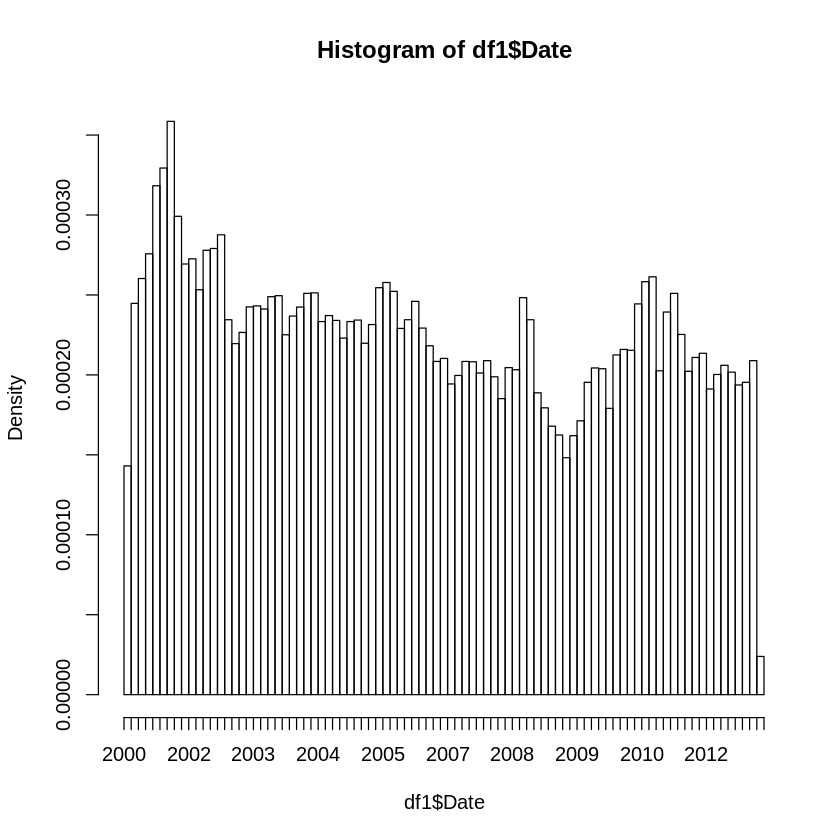

In [41]:
hist(df1$Date, breaks=100)

In [42]:
# In general, does it look like crime increases or decreases from 2002 - 2012?
# Increases
# Decreases # correct

# In general, does it look like crime increases or decreases from 2005 - 2008?
# Increases
# Decreases # correct

# In general, does it look like crime increases or decreases from 2009 - 2011?
# Increases # correct
# Decreases

# Problem 3.2 - Visualizing Crime Trends
#### Now, let's see how arrests have changed over time. Create a boxplot of the variable "Date", sorted by the variable "Arrest" (if you are not familiar with boxplots and would like to learn more, check out this [tutorial](http://msenux2.redwoods.edu/MathDept/R/boxplot.php)). In a boxplot, the bold horizontal line is the median value of the data, the box shows the range of values between the first quartile and third quartile, and the whiskers (the dotted lines extending outside the box) show the minimum and maximum values, excluding any outliers (which are plotted as circles). Outliers are defined by first computing the difference between the first and third quartile values, or the height of the box. This number is called the Inter-Quartile Range (IQR). Any point that is greater than the third quartile plus the IQR or less than the first quartile minus the IQR is considered an outlier.
####  Does it look like there were more crimes for which arrests were made in the first half of the time period or the second half of the time period? (Note that the time period is from 2001 to 2012, so the middle of the time period is the beginning of 2007.)


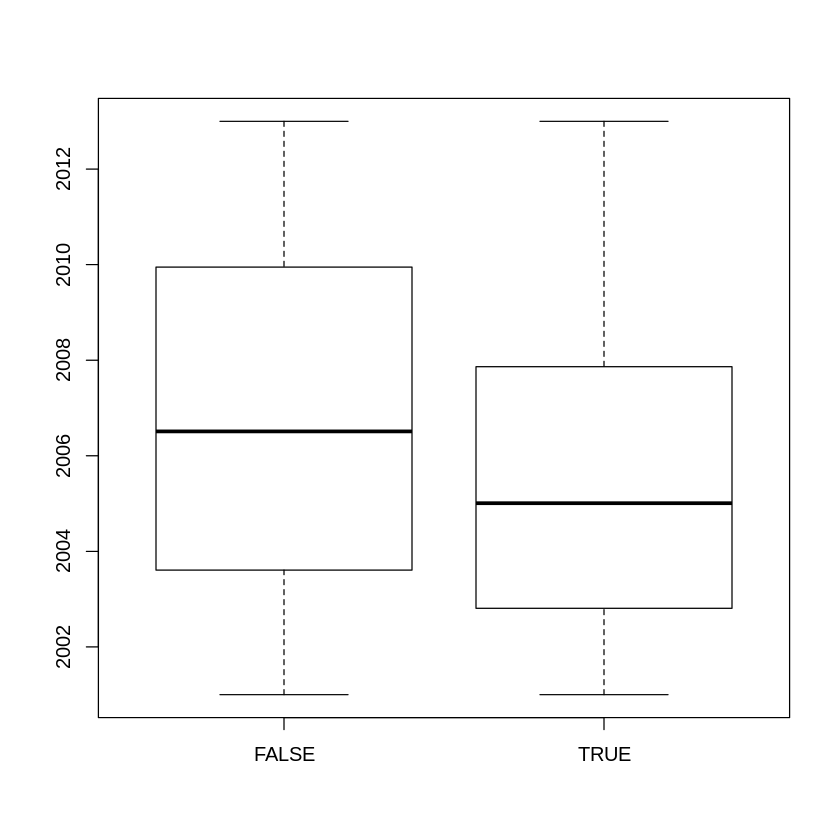

In [43]:
boxplot(df1$Date ~ df1$Arrest)

First half # correct <br>
Second half 

# Problem 3.3 - Visualizing Crime Trends
#### Let's investigate this further. Use the table function for the next few questions.
#### For what proportion of motor vehicle thefts in 2001 was an arrest made?
#### Note: in this question and many others in the course, we are asking for an answer as a proportion. Therefore, your answer should take a value between 0 and 1.

In [44]:
only_2001 <- subset(df1, Year == 2001)
a = table(only_2001$Arrest)
a[2]/nrow(only_2001)

TRUE 
0.1041173

# Problem 3.4 - Visualizing Crime Trends
#### For what proportion of motor vehicle thefts in 2007 was an arrest made?

In [45]:
only_2007 <- subset(df1, Year == 2007)
a = table(only_2007$Arrest)
a[2]/nrow(only_2007)

TRUE 
0.08487395

# Problem 3.5 - Visualizing Crime Trends
#### For what proportion of motor vehicle thefts in 2012 was an arrest made?

In [46]:
only_2012 <- subset(df1, Year == 2012)
a = table(only_2012$Arrest)
a[2]/nrow(only_2012)

TRUE 
0.03902924

# Problem 4.1 - Popular Locations
#### Analyzing this data could be useful to the Chicago Police Department when deciding where to allocate resources. If they want to increase the number of arrests that are made for motor vehicle thefts, where should they focus their efforts?
#### We want to find the top five locations where motor vehicle thefts occur. If you create a table of the LocationDescription variable, it is unfortunately very hard to read since there are 78 different locations in the data set. By using the sort function, we can view this same table, but sorted by the number of observations in each category. In your R console, type:
#### sort(table(mvt\\$LocationDescription))
#### Which locations are the top five locations for motor vehicle thefts, excluding the "Other" category? You should select 5 of the following options.

In [47]:
sort(table(df1$LocationDescription), decreasing = TRUE)


                                         STREET 
                                         156564 
                 PARKING LOT/GARAGE(NON.RESID.) 
                                          14852 
                                          OTHER 
                                           4573 
                                          ALLEY 
                                           2308 
                                    GAS STATION 
                                           2111 
                         DRIVEWAY - RESIDENTIAL 
                                           1675 
                  RESIDENTIAL YARD (FRONT/BACK) 
                                           1536 
                                      RESIDENCE 
                                           1302 
                               RESIDENCE-GARAGE 
                                           1176 
                                VACANT LOT/LAND 
                                            985 
                   

# Problem 4.2 - Popular Locations
#### Create a subset of your data, only taking observations for which the theft happened in one of these five locations, and call this new data set "Top5". To do this, you can use the | symbol. In lecture, we used the & symbol to use two criteria to make a subset of the data. To only take observations that have a certain value in one variable or the other, the | character can be used in place of the & symbol. This is also called a logical "or" operation.
#### Alternately, you could create five different subsets, and then merge them together into one data frame using rbind.
#### How many observations are in Top5?

In [48]:
Top5  <- subset(df1, LocationDescription == "STREET" | 
                       LocationDescription == "PARKING LOT/GARAGE(NON.RESID.)" |
                       LocationDescription == "ALLEY" |
                       LocationDescription == "GAS STATION"|
                       LocationDescription == "DRIVEWAY - RESIDENTIAL")
nrow(Top5)

[1] 177510

# Problem 4.3 - Popular Locations
#### R will remember the other categories of the LocationDescription variable from the original dataset, so running table(Top5\\$LocationDescription) will have a lot of unnecessary output. To make our tables a bit nicer to read, we can refresh this factor variable. In your R console, type:
#### Top5\\$LocationDescription = factor(Top5\\$LocationDescription)
#### If you run the str or table function on Top5 now, you should see that LocationDescription now only has 5 values, as we expect.
#### Use the Top5 data frame to answer the remaining questions.
#### One of the locations has a much higher arrest rate than the other locations. Which is it? Please enter the text in exactly the same way as how it looks in the answer options for Problem 4.1.

In [73]:
Top5$LocationDescription = factor(Top5$LocationDescription)
a <- table(Top5$LocationDescription, Top5$Arrest)
which.max(a[,2] / (a[,2]+a[,1]))

GAS STATION 
          3

# Problem 4.4 - Popular Locations
#### On which day of the week do the most motor vehicle thefts at gas stations happen?

In [85]:
only_gas <- subset(Top5, LocationDescription == "GAS STATION")
which.max(table(only_gas$Weekday))

Saturday 
       3

# Problem 4.5 - Popular Locations
#### mOn which day of the week do the fewest motor vehicle thefts in residential driveways happen?

In [89]:
only_driveways  <- subset(Top5, LocationDescription == "DRIVEWAY - RESIDENTIAL")
which.min(table(only_driveways$Weekday))

Saturday 
       3